


.
  # House Price Prediction

In [1]:
# Importing the necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
# reading the train dataset


df_train = pd.read_csv("train.csv")

In [3]:
# Reading the test dataset

df_test =pd.read_csv("test.csv")

In [4]:
df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


In [5]:
# df_train shows the dataset which contains 1168 rows and 81 columns
# The main important thing here is that our target column is SalePrice. 
# So we are building the model to predict the Sale Price of house based on the other column infos 
# and here the target column "SalePrice" has continuous values and hence its a regression problem. 
# We need to choose the regression models to solve this problem

In [6]:
df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal


In [7]:
# df_test shows the dataset which contains 292 rows and 80 columns
# Here we can observe that we have 80 columns and column "SalePrice" is not present in our test dataset as we saw in train dataset 
# Meaning we are building the model to predict the SalePrice based on the other column infos  
# We need to choose the regression models to do so 

Using regression models in this project to predict the Sale price of House on our test dataset.

**Exploratory Data Analysis (EDA)**

In [8]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [9]:
# df_train.head() displays the first 5 row values(indexed from 0-4) from the train dataset

In [10]:
df_train.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000
1167,617,60,RL,NaN,7861,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,183200


In [11]:
# df.tail() displays the last 5 rows from the training dataset(indexed from 1163-1167), 
# so from here we can draw conclusion that we have 1168 rows in total in our training set

In [12]:
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [13]:
# df_test.head() displays the first 5 row values(indexed from 0-4) from the test dataset

In [14]:
df_test.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal
291,1379,160,RM,21.0,1953,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal


In [15]:
# df.tail() displays the last 5 rows from the testing dataset(indexed from 287-291), 
# so from here we can draw conclusion that we have 292 rows in total in our testing set

In [16]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [17]:
# df.columns displays the list of all column headings in our training dataset
# We have 81 columns including SalePrice in training set

In [18]:
df_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [19]:
# df.columns displays the list of all column headings in our testing dataset
# We have 80 columns excluding SalePrice in testing set

In [20]:
df_train.shape

(1168, 81)

In [21]:
# No. of rows in training set is 1168
# No. of columns is training set is 81

In [22]:
df_test.shape

(292, 80)

In [23]:
# No. of rows in testing set is 292
# No. of columns in testing set is 80

In [24]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [25]:
# from df_train.info() we can infer that we have 1168 row entries in total(0-1167)
# we have 81 data columns(0-80)
# Few data column contains no null values, hence the non-null count is 1168 for all these columns of training set
# We have null values present in many other columns and the count also can be seen in the column non-null count 
# From here we can also infer that few columns have integer values present in them and hence the datatype int64
# Majority of the columns have string values present in them and is not identified hence displayed as object datatype
# These non identifiable columns needs to be converted into identifiable type for the models to understand and perform 
# their predictions
# The column "SalePrice" has all integer values and hence the Datatype is int64
# We can also observe that most of the values in PoolQC column is null, hence it can be dropped

In [26]:
df_train.drop(["PoolQC"],axis=1,inplace=True)

In [27]:
# We have successfully dropped the column PoolQC which contained majority of null values from training set

In [28]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [29]:
# from df_test.info() we can infer that we have 292 row entries in total(0-291)
# we have 80 data columns(0-79) 
# Few data column contains no null values, hence the non-null count is 292 for all these columns of testing set
# We have null values present in many other columns and the count also can be seen in the column non-null count 
# From here we can also infer that few columns have integer values present in them and hence the datatype int64
# Majority of the columns have string values present in them and is not identified hence displayed as object datatype
# These non identifiable columns needs to be converted into identifiable type for the models to understand and perform 
# their predictions
# Here the target column "SalePrice" is excluded in the testing set
# We can also observe that most of the values in PoolQC column is null, hence it can be dropped

In [30]:
df_test.drop(["PoolQC"],axis=1,inplace=True)

In [31]:
# We have successfully dropped the column PoolQC which contained majority of null values from the testing set

In [32]:
# Checking missing value in  the training dataset

df_train.isnull().values.any()

True

Presence of null values in training set

In [33]:
df_train.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 80, dtype: int64

In [34]:
# So the null values are present in some of the columns and their count is provided here

In [35]:
# Let's check the presence of null values in the test set


df_test.isnull().values.any()

True

Presence of null values in testing set

In [36]:
df_test.isnull().sum()

Id                0
MSSubClass        0
MSZoning          0
LotFrontage      45
LotArea           0
                 ..
MiscVal           0
MoSold            0
YrSold            0
SaleType          0
SaleCondition     0
Length: 79, dtype: int64

In [37]:
# So the null values are present in some of the columns and their count is provided here

**Let's check the presence of duplicates in our training data**

In [38]:
df_train.duplicated().sum()

0

No duplicates present in our training set

**Let's check the presence of duplicates in our testing data**

In [39]:
# Trying to find the duplicate rows in our testing dataset

duplicate=df_test.duplicated()
print(duplicate.sum())      # gives no. of duplicate rows in the testing dataset
df_test[duplicate]               # prints the duplicate rows in the testing dataset

0


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition


No duplicates present in our testing set

In [40]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [41]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 79 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [42]:
df_train.describe()


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,954.00000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.98847,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,...,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,24.82875,8957.442311,1.390153,1.124343,30.145255,20.785185,182.595606,462.664785,...,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.00000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.00000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.00000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,80.00000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,...,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.00000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [43]:
# From df_train.describe() we can see the details about various statistical data like Count,Mean,Standard Deviation,Max Value,Min Value for our training dataset
# So from min and max values, we basically get the range

In [44]:
df_test.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,292.000000,292.000000,247.000000,292.000000,292.000000,292.000000,292.000000,292.000000,291.000000,292.000000,...,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,292.000000,292.000000,292.000000
mean,755.955479,57.414384,66.425101,10645.143836,6.078767,5.493151,1972.616438,1985.294521,109.171821,439.294521,...,457.458904,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,28.184932,6.232877,2007.859589
std,442.565228,43.780649,21.726343,13330.669795,1.356147,1.063267,30.447016,20.105792,175.030021,429.559675,...,210.785591,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,224.036218,2.774556,1.322867
min,6.000000,20.000000,21.000000,1526.000000,3.000000,3.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,2006.000000
25%,377.750000,20.000000,53.500000,7200.000000,5.000000,5.000000,1954.000000,1968.000000,0.000000,0.000000,...,300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,4.000000,2007.000000
50%,778.000000,50.000000,65.000000,9200.000000,6.000000,5.000000,1976.000000,1994.000000,0.000000,369.500000,...,467.500000,0.000000,28.500000,0.000000,0.000000,0.000000,0.0,0.000000,6.000000,2008.000000
75%,1152.250000,70.000000,79.000000,11658.750000,7.000000,6.000000,2001.000000,2003.250000,180.000000,700.500000,...,569.750000,149.250000,66.000000,0.000000,0.000000,0.000000,0.0,0.000000,8.000000,2009.000000
max,1456.000000,190.000000,150.000000,215245.000000,10.000000,9.000000,2009.000000,2010.000000,1031.000000,1767.000000,...,1052.000000,728.000000,418.000000,330.000000,407.000000,396.000000,0.0,3500.000000,12.000000,2010.000000


In [45]:
# From df_test.describe() we can see the details about various statistical data like Count,Mean,Standard Deviation,Max Value,Min Value for our training dataset
# So from min and max values, we basically get the range

In [46]:
null_columns = df_train.columns[df_train.isnull().any()]
df_train[null_columns].isna().sum()

LotFrontage      214
Alley           1091
MasVnrType         7
MasVnrArea         7
BsmtQual          30
BsmtCond          30
BsmtExposure      31
BsmtFinType1      30
BsmtFinType2      31
FireplaceQu      551
GarageType        64
GarageYrBlt       64
GarageFinish      64
GarageQual        64
GarageCond        64
Fence            931
MiscFeature     1124
dtype: int64

**From above we can see that these are the columns of the training set that contains the null values and the number of null value count can also be seen**

These features don't contain enough useful data and are not much helpful for our predictions so let's delete the features from the training set which contains more than half of null values

In [47]:
df_train.drop(["Alley","Fence","MiscFeature"],axis=1,inplace=True)

In [48]:
df_train.shape

(1168, 77)

We can see that the columns are successfully dropped from the training set

In [49]:
null_columns = df_test.columns[df_test.isnull().any()]
df_test[null_columns].isna().sum()

LotFrontage      45
Alley           278
MasVnrType        1
MasVnrArea        1
BsmtQual          7
BsmtCond          7
BsmtExposure      7
BsmtFinType1      7
BsmtFinType2      7
Electrical        1
FireplaceQu     139
GarageType       17
GarageYrBlt      17
GarageFinish     17
GarageQual       17
GarageCond       17
Fence           248
MiscFeature     282
dtype: int64

**From above we can see that these are the columns of the testing set that contains the null values and the number of null value count can also be seen**

These features don't contain enough useful data and are not much helpful for our predictions so let's delete the features from the training set which contains more than half of null values

In [50]:
df_test.drop(["Alley","Fence","MiscFeature"],axis=1,inplace=True)

In [51]:
df_test.shape

(292, 76)

We can see that the columns are successfully dropped from the testing set

# Data Manipulation

**Missing value treatment**

Separating the numerical and categorical features

In [52]:
df_train_num = df_train.select_dtypes(exclude='object')
df_train_obj = df_train.select_dtypes(include='object')

df_test_num = df_test.select_dtypes(exclude='object')
df_test_obj = df_test.select_dtypes(include='object')

In [53]:
# Filling missing values in numeric fields with median while categorical fields with None

df_train_obj = df_train_obj.fillna("None")
df_train_num = df_train_num.fillna(df_train_num.median())

df_test_obj = df_test_obj.fillna("None")
df_test_num = df_test_num.fillna(df_test_num.median())

**Lets Encode the categorical features from both training and testing set**

In [54]:
df_train_obj= pd.get_dummies(df_train_obj, drop_first=True)

df_test_obj= pd.get_dummies(df_test_obj, drop_first=True)

**Concating both the numerical and categorical features to obtain the final training set**

In [55]:
df_final_train= pd.concat([df_train_num, df_train_obj], axis=1)
df_final_train.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,127,120,70.0,4928,6,5,1976,1976,0.0,120,...,0,0,0,0,1,0,0,0,1,0
1,889,20,95.0,15865,8,6,1970,1970,0.0,351,...,0,0,0,0,1,0,0,0,1,0
2,793,60,92.0,9920,7,5,1996,1997,0.0,862,...,0,0,0,0,1,0,0,0,1,0
3,110,20,105.0,11751,6,6,1977,1977,480.0,705,...,0,0,0,0,0,0,0,0,1,0
4,422,20,70.0,16635,6,7,1977,2000,126.0,1246,...,0,0,0,0,1,0,0,0,1,0


**Concating both numerical and categorical features to obtain the final testing set**

In [56]:
df_final_test= pd.concat([df_test_num, df_test_obj], axis=1)
df_final_test.head()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_ConLD,SaleType_ConLw,SaleType_New,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,337,20,86.0,14157,9,5,2005,2006,200.0,1249,...,0,1,0,0,0,0,1,0,1,0
1,1018,120,65.0,5814,8,5,1984,1984,0.0,1036,...,0,1,0,0,0,0,0,0,0,0
2,929,20,65.0,11838,8,5,2001,2001,0.0,0,...,0,1,0,0,0,0,1,0,1,0
3,1148,70,75.0,12000,7,7,1941,1950,0.0,275,...,0,1,0,0,0,0,1,0,1,0
4,1227,60,86.0,14598,6,5,2007,2007,74.0,0,...,0,1,0,0,0,0,1,0,1,0


In [57]:
df_final_train.isnull().sum().sort_values()

Id                       0
Foundation_PConc         0
Foundation_Slab          0
Foundation_Stone         0
Foundation_Wood          0
                        ..
Condition1_RRNn          0
Condition2_Feedr         0
Condition2_Norm          0
Condition2_PosN          0
SaleCondition_Partial    0
Length: 245, dtype: int64

In [58]:
df_final_test.isnull().sum().sort_values()

Id                       0
Foundation_Slab          0
Foundation_Stone         0
Foundation_Wood          0
BsmtQual_Fa              0
                        ..
Neighborhood_Veenker     0
Condition1_Feedr         0
Condition1_Norm          0
Neighborhood_NoRidge     0
SaleCondition_Partial    0
Length: 216, dtype: int64

**All the missing values are filled from both training and testing set. Let's check for the datatypes now as we have performed encoding on the categorical features**

In [59]:
df_final_train.dtypes

Id                         int64
MSSubClass                 int64
LotFrontage              float64
LotArea                    int64
OverallQual                int64
                          ...   
SaleCondition_AdjLand      uint8
SaleCondition_Alloca       uint8
SaleCondition_Family       uint8
SaleCondition_Normal       uint8
SaleCondition_Partial      uint8
Length: 245, dtype: object

In [60]:
df_final_test.dtypes

Id                         int64
MSSubClass                 int64
LotFrontage              float64
LotArea                    int64
OverallQual                int64
                          ...   
SaleType_New               uint8
SaleType_WD                uint8
SaleCondition_Family       uint8
SaleCondition_Normal       uint8
SaleCondition_Partial      uint8
Length: 216, dtype: object

**Now that from above we can verify that both the training and testing set categorical features are encoded and the datatypes for the features are either float or integer**

**Uni-Variant Analysis**

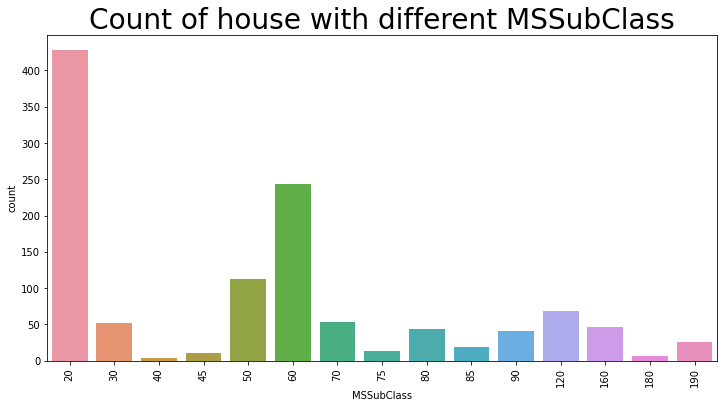

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64

In [61]:
/# Let's try to plot the count of MSSubClass-

plt.figure(figsize=(12,6))
sns.countplot(df_final_train['MSSubClass'])
plt.title('Count of house with different MSSubClass', size=28)
plt.xticks(rotation=90)
plt.show()
df_final_train["MSSubClass"].value_counts()


**Highest number of houses habe the MSSubClass equal to 20**

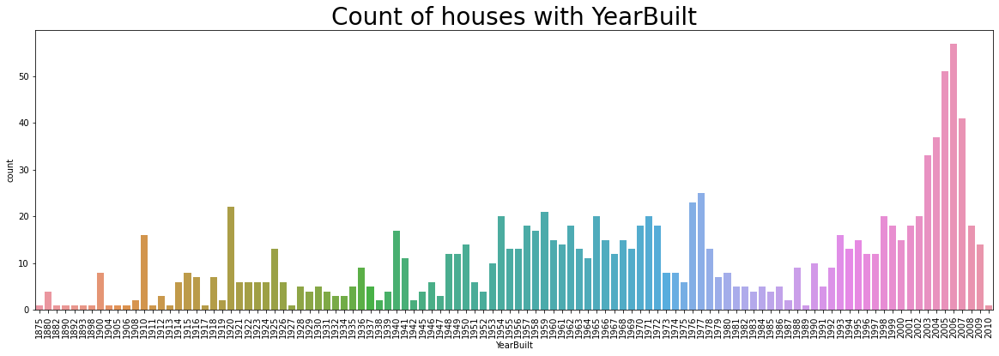

2006    57
2005    51
2007    41
2004    37
2003    33
        ..
1913     1
1917     1
1927     1
1989     1
1875     1
Name: YearBuilt, Length: 110, dtype: int64

In [62]:
# Let's try to plot the count of YearBuilt.

plt.figure(figsize=(20,6))
sns.countplot(df_train['YearBuilt'])
plt.title('Count of houses with YearBuilt', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["YearBuilt"].value_counts()

**Greater count of houses are built in the year 2005 and 2006**

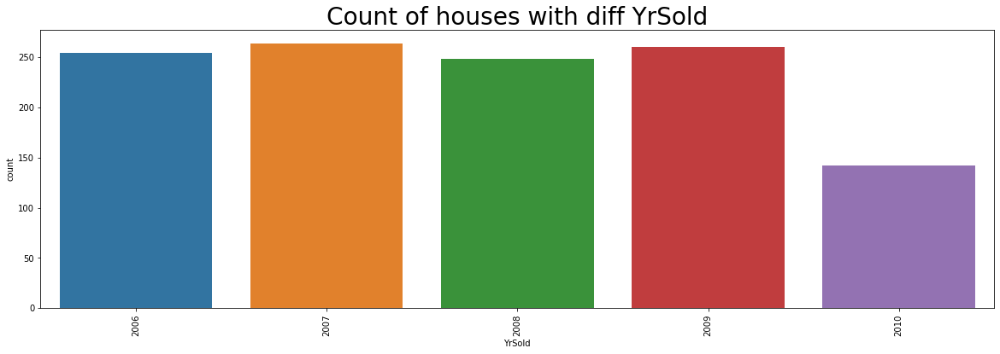

2007    264
2009    260
2006    254
2008    248
2010    142
Name: YrSold, dtype: int64

In [63]:
# Let's try to plot the count of YrSold.

plt.figure(figsize=(20,6))
sns.countplot(df_train['YrSold'])
plt.title('Count of houses with diff YrSold', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["YrSold"].value_counts()

**Almost equal no. of houses are sold in the years 2006,2007,2008 and 2009** 

**The number of houses sold in the year 2010 is less compared to all other years**

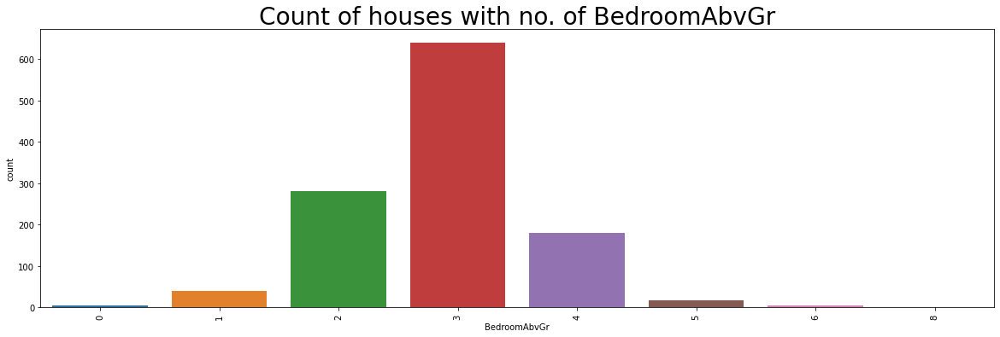

3    640
2    281
4    180
1     39
5     18
6      5
0      4
8      1
Name: BedroomAbvGr, dtype: int64

In [64]:
# Let's try to plot the count houses with no. of BedroomAbvGr.

plt.figure(figsize=(20,6))
sns.countplot(df_train['BedroomAbvGr'])
plt.title('Count of houses with no. of BedroomAbvGr', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["BedroomAbvGr"].value_counts()

**Larger number of houses have 3 rooms above Ground** 

**Next larger number of houses have 2 rooms above Ground**

**Only one house among the survey has 8 rooms above Ground**

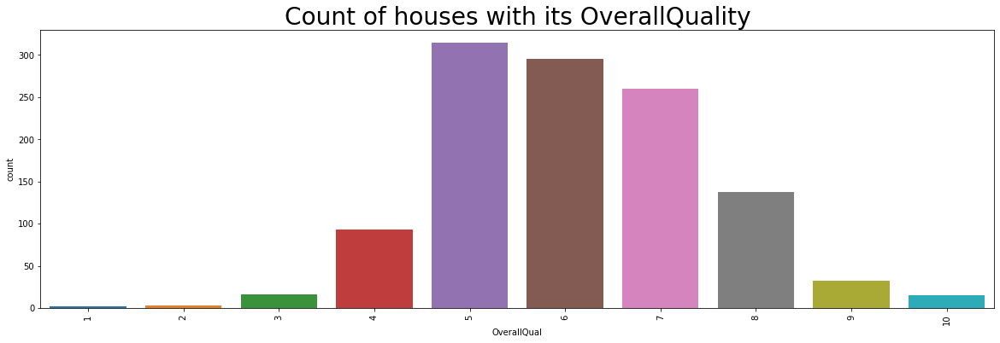

5     314
6     295
7     260
8     138
4      93
9      32
3      16
10     15
2       3
1       2
Name: OverallQual, dtype: int64

In [65]:
# Let's try to plot the count houses with its OverallQual.

plt.figure(figsize=(20,6))
sns.countplot(df_train['OverallQual'])
plt.title('Count of houses with its OverallQuality', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["OverallQual"].value_counts()

**Larger number of houses have the Quality 5 meaning Average, Quality of houses rated 6 meaning Above Average and 7 meaning Good are also high in number**

**We can infer that most of the houses have overall quality and finishing ranging from average to good quality**

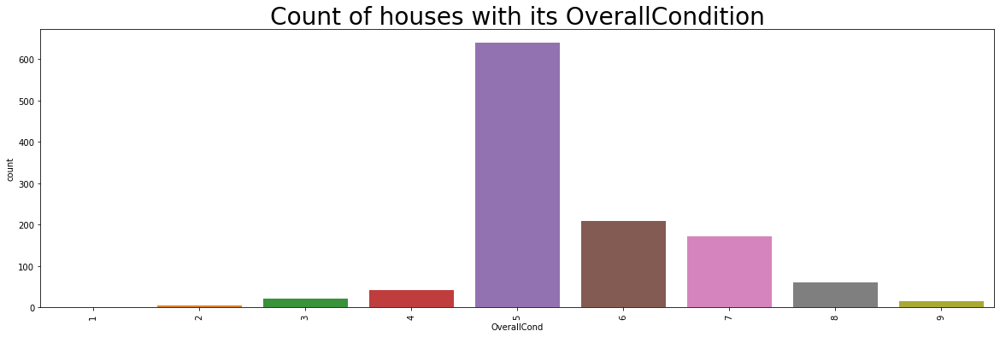

5    640
6    209
7    172
8     61
4     43
3     21
9     16
2      5
1      1
Name: OverallCond, dtype: int64

In [66]:
# Let's try to plot the count houses with its OverallCond.

plt.figure(figsize=(20,6))
sns.countplot(df_train['OverallCond'])
plt.title('Count of houses with its OverallCondition', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["OverallCond"].value_counts()


**Most of the houses have average overall condition**

**The condition of houses being above average and good are also good in number**

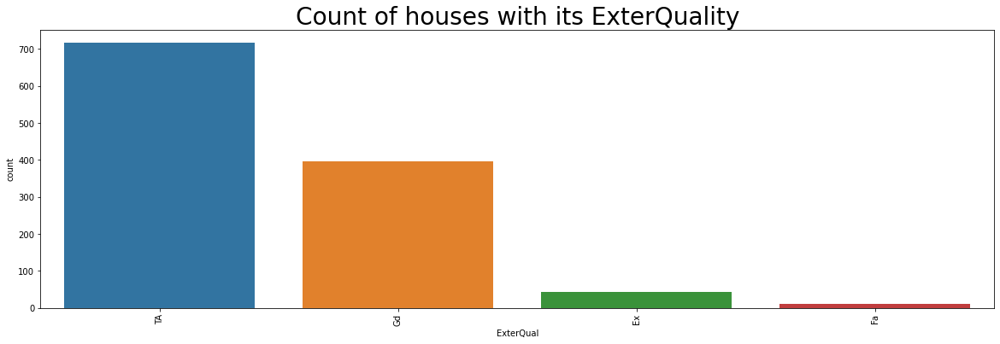

TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64

In [67]:
# Let's try to plot the count houses with its ExterQuality.

plt.figure(figsize=(20,6))
sns.countplot(df_train['ExterQual'])
plt.title('Count of houses with its ExterQuality', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["ExterQual"].value_counts()


**Highest number of houses have Average/Typical exterior quality**

**Around 397 houses are of Good exterior quality**

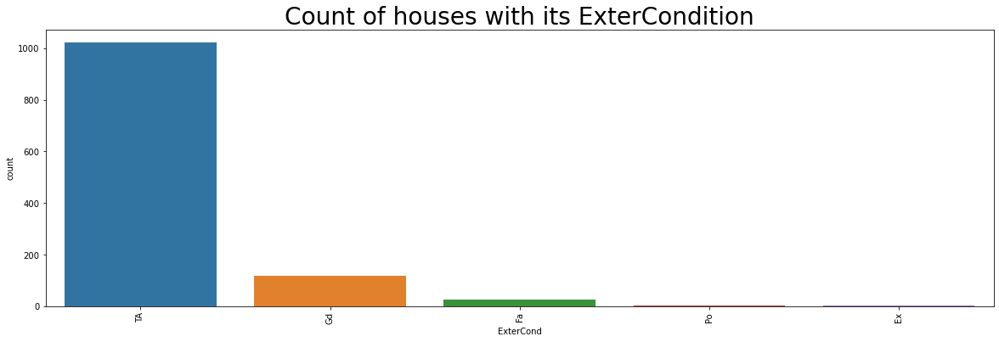

TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64

In [68]:
# Let's try to plot the count houses with its ExterCondition.

plt.figure(figsize=(20,6))
sns.countplot(df_train['ExterCond'])
plt.title('Count of houses with its ExterCondition', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["ExterCond"].value_counts()



**Around 1022 houses have Typical exterior condition, so majority houses holds Typical condition external**

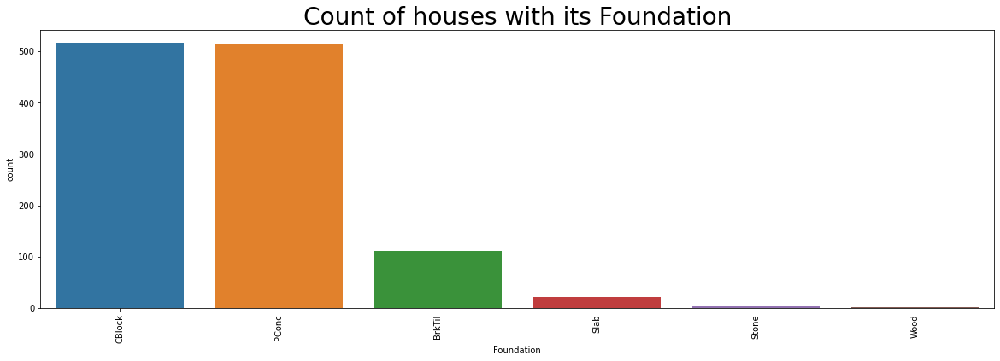

CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64

In [69]:
# Let's try to plot the count houses with its Foundation.

plt.figure(figsize=(20,6))
sns.countplot(df_train['Foundation'])
plt.title('Count of houses with its Foundation', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["Foundation"].value_counts()


**Around 516 houses have CBlock as their foundation and 513 houses have PConc as their foundation**

**Only 1 house has Wood foundation**

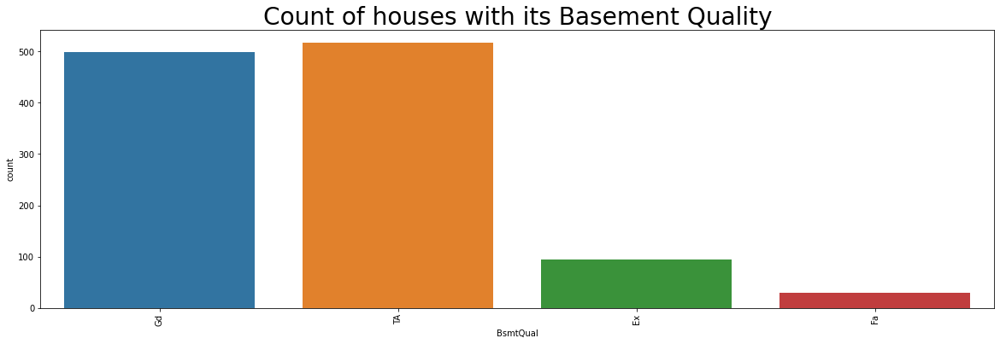

TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64

In [70]:
# Let's try to plot the count houses with its Basement Quality.

plt.figure(figsize=(20,6))
sns.countplot(df_train['BsmtQual'])
plt.title('Count of houses with its Basement Quality', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["BsmtQual"].value_counts()



**Around 517 houses have Typical Basement Quality and very good number of houses i.e., 498 houses have Good Basement Quality**

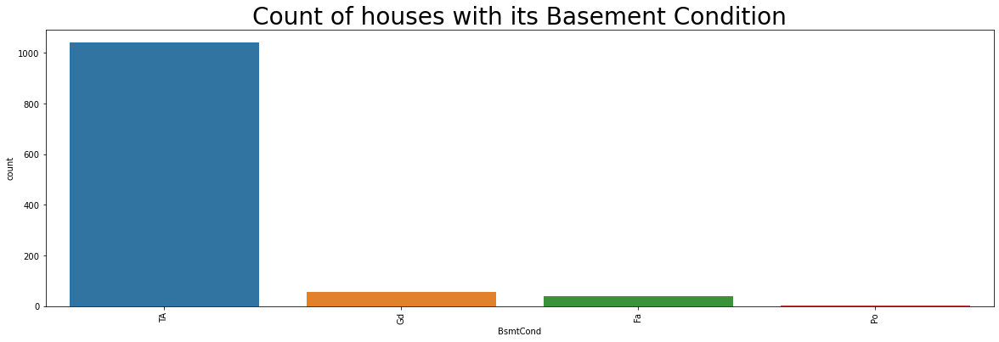

TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

In [71]:
# Let's try to plot the count houses with its Basement Condition.

plt.figure(figsize=(20,6))
sns.countplot(df_train['BsmtCond'])
plt.title('Count of houses with its Basement Condition', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["BsmtCond"].value_counts()

**The basement condition for majority of houses is Typical**

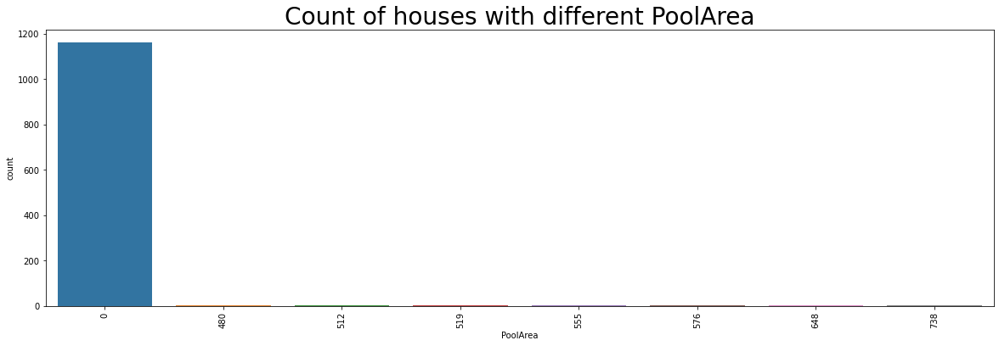

0      1161
738       1
648       1
576       1
555       1
519       1
512       1
480       1
Name: PoolArea, dtype: int64

In [72]:
# Let's try to plot the count houses with different PoolArea.

plt.figure(figsize=(20,6))
sns.countplot(df_train['PoolArea'])
plt.title('Count of houses with different PoolArea', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["PoolArea"].value_counts()


**Majority of houses don't have any pool area**

**1 houses each have pool area as 738 sq.ft, 648 sq.ft, 576 sq.ft, 555 sq.ft, 519 sq.ft, 512 sq.ft and 480 sq.ft**

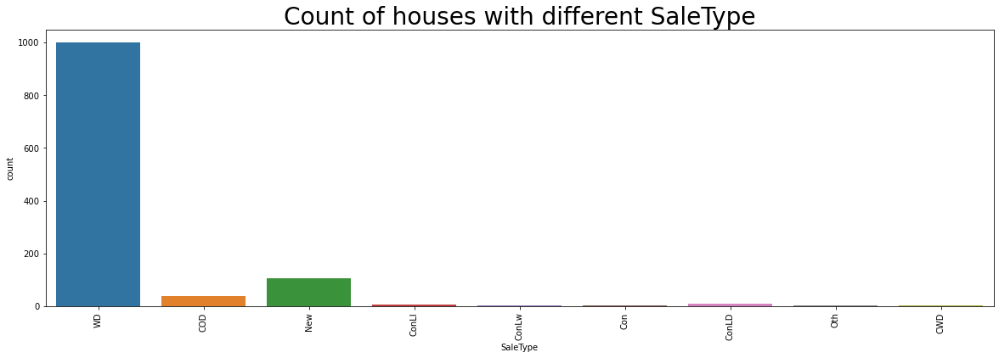

WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
CWD        3
Oth        3
Con        2
Name: SaleType, dtype: int64

In [73]:
# Let's try to plot the count houses with different SaleType.

plt.figure(figsize=(20,6))
sns.countplot(df_train['SaleType'])
plt.title('Count of houses with different SaleType', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["SaleType"].value_counts()




**Majority of houses i.e., 999 houses have Conventional Warranty Deed**

**106 houses have SaleType as new, meaning they are just constructed and sold**

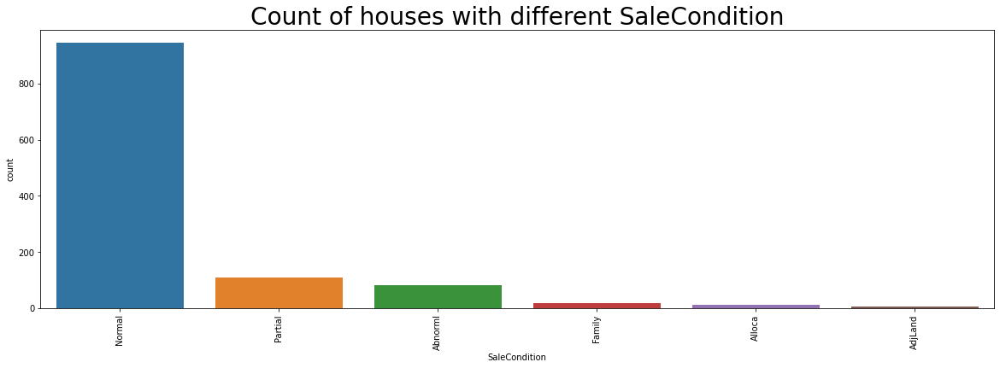

Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64

In [74]:
# Let's try to plot the count houses with different SaleCondition.

plt.figure(figsize=(20,6))
sns.countplot(df_train['SaleCondition'])
plt.title('Count of houses with different SaleCondition', size=28)
plt.xticks(rotation=90)
plt.show()
df_train["SaleCondition"].value_counts()


**The SaleCondition for majority of houses i.e., 945 in number are Normal**

**Bi-Variant Analysis**

(array([  0.,  25.,  50.,  75., 100., 125., 150., 175., 200.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

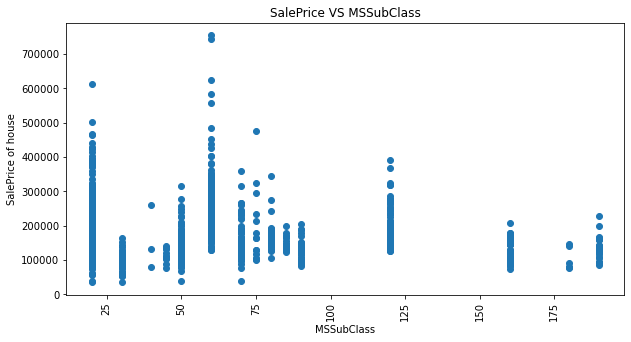

In [75]:
plt.figure(figsize = (10, 5))
plt.title('SalePrice VS MSSubClass')
plt.scatter(df_train['MSSubClass'], df_train['SalePrice'])
plt.xticks(rotation = 90)
plt.xlabel('MSSubClass')
plt.ylabel('SalePrice of house')
plt.xticks(rotation = 90)

**We see that the price of house with MSSubClass between 50 to 75 is high**

**The price of house for the MSSubClass greater than 150 is low**

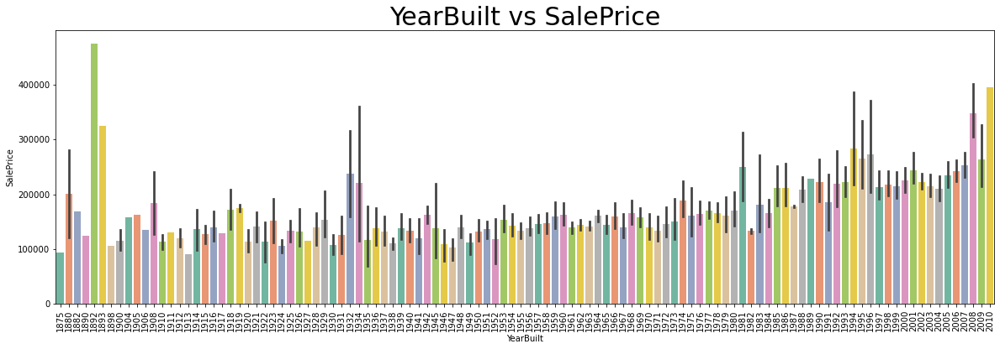

In [76]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['YearBuilt'], df_train['SalePrice'], palette='Set2')
plt.title('YearBuilt vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()





**The SalePrice of the house is very much high in the year 1892**

**Then it decreases after 1893, shows a increase an decrease fashion**

**Later again the SalePrice of the house is high in the year 2010**

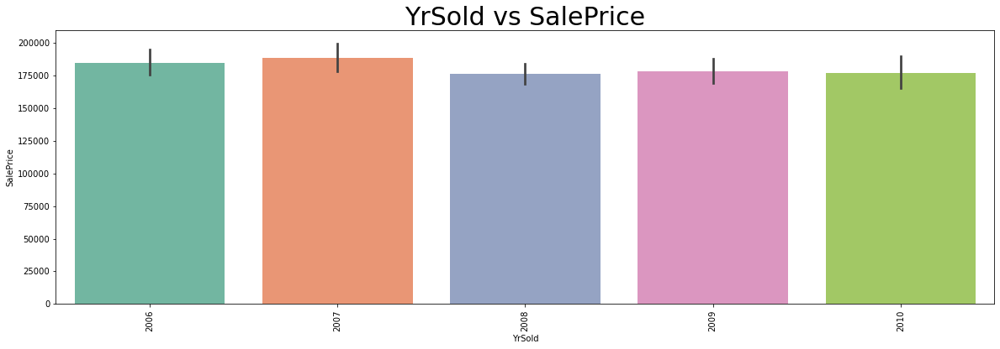

In [77]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['YrSold'], df_train['SalePrice'], palette='Set2')
plt.title('YrSold vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**There is no much variation in the Sale Price of the houses with year of selling**

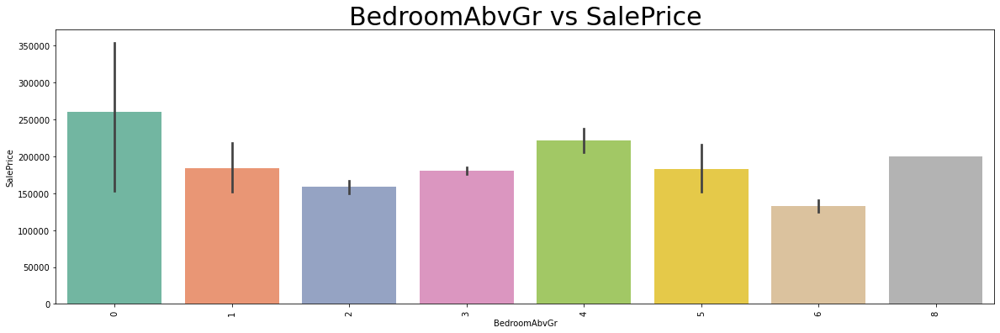

In [78]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['BedroomAbvGr'], df_train['SalePrice'], palette='Set2')
plt.title('BedroomAbvGr vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**We can see that the Price of house is high for the houses that don't have any bedrooms above Ground**

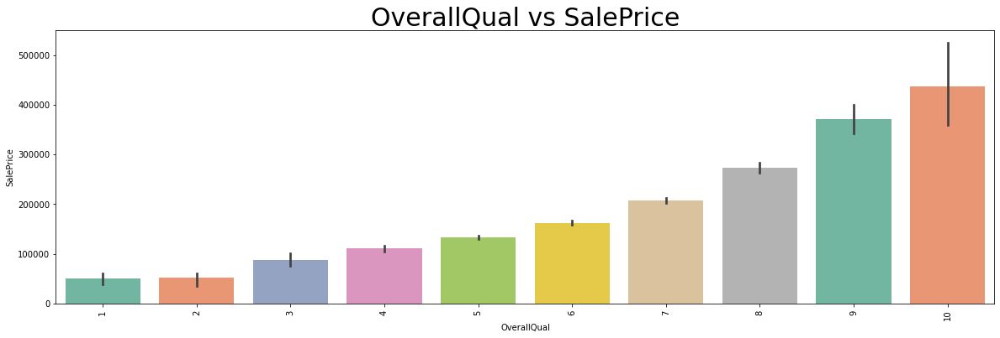

In [79]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['OverallQual'], df_train['SalePrice'], palette='Set2')
plt.title('OverallQual vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()



**The Overall Quality of the houses versus its SalePrice shows the increasing pattern meaning as the Overall Quality of the house increases their is a increase with the Sale Price of the house**

**The SalePrice of the houses is least for low overall quality ones and is higher for the Overall high Quality houses** 

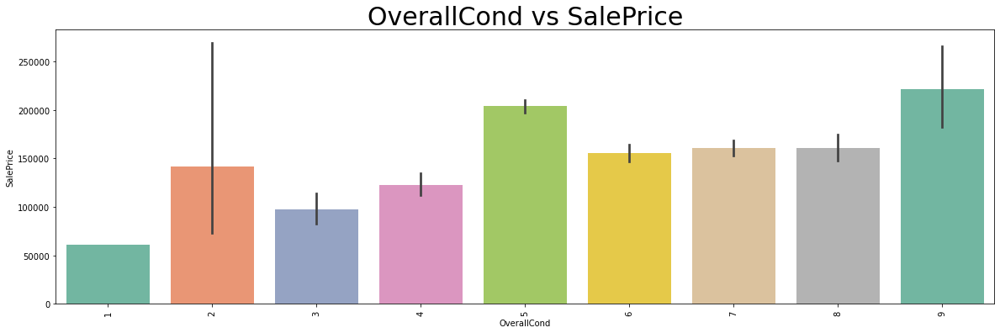

In [80]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['OverallCond'], df_train['SalePrice'], palette='Set2')
plt.title('OverallCond vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()




**The graph plotted for Overall Condition versus the SalePrice shows increasing and decreasing trend**

**Least Overall Condition has the lower price of the house**

**The Sale Price of the house is stable for the overall condition rated as 7 and 8**

**The Sale Price is highest for Overall Condition rated as 9**

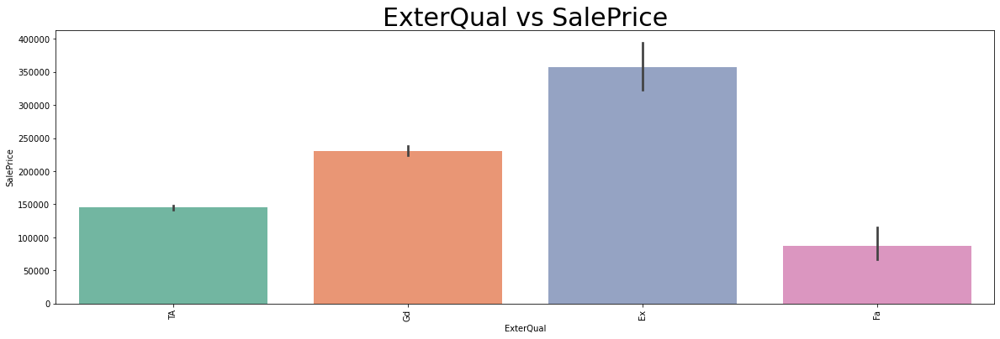

In [81]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['ExterQual'], df_train['SalePrice'], palette='Set2')
plt.title('ExterQual vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**The Sale Price of the house is highest for the External Quality being Excellent**

**The SalePrice has the increasing trend with the increase of the External Quality Typical, Good and Excellent**

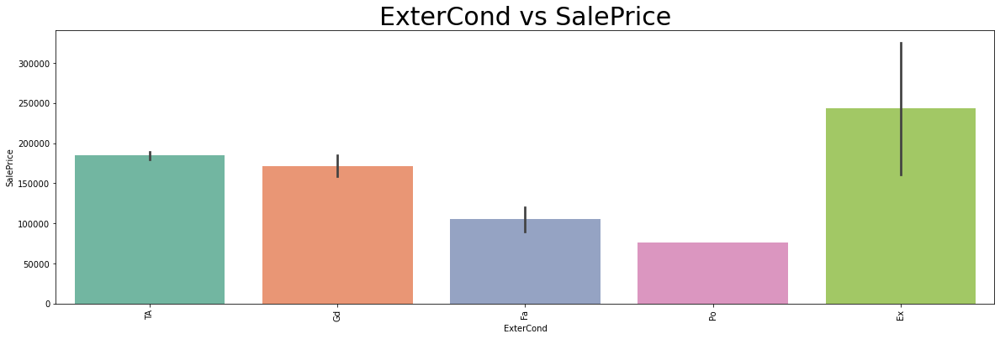

In [82]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['ExterCond'], df_train['SalePrice'], palette='Set2')
plt.title('ExterCond vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**The SalePrice of the house is less for the External Condition being Poor**

**The SalePrice is highest for the Excellent External Condition**

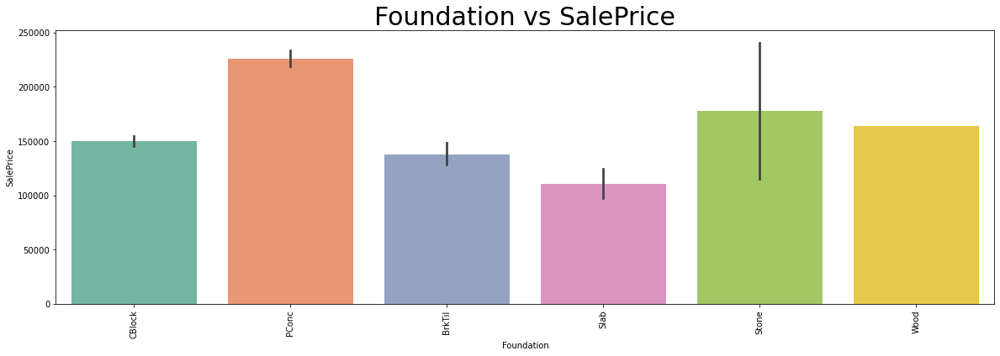

In [83]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['Foundation'], df_train['SalePrice'], palette='Set2')
plt.title('Foundation vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**The SalePrice of the house is highest for PConc being foundation for the house**

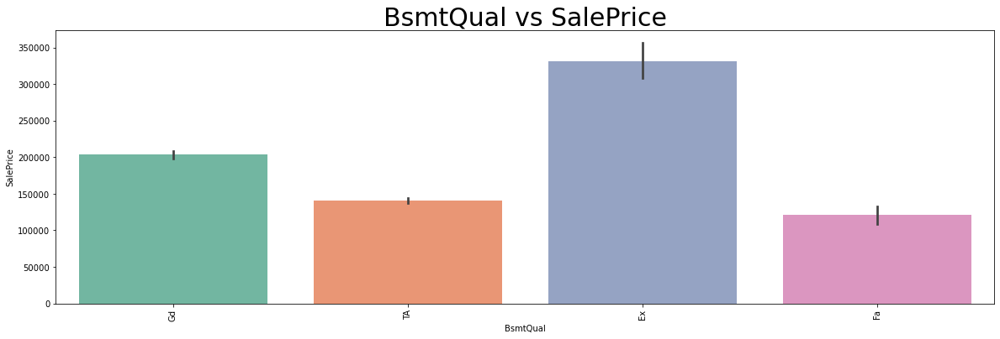

In [84]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['BsmtQual'], df_train['SalePrice'], palette='Set2')
plt.title('BsmtQual vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**The SalePrice of the house is highest for the Basement Quality "Excellent"**

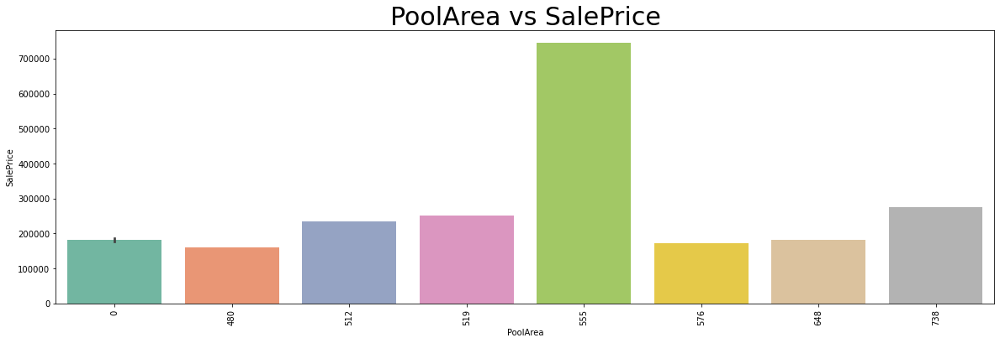

In [85]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['PoolArea'], df_train['SalePrice'], palette='Set2')
plt.title('PoolArea vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**The SalePrice of the house is greater for the PoolArea of 555 square feet**

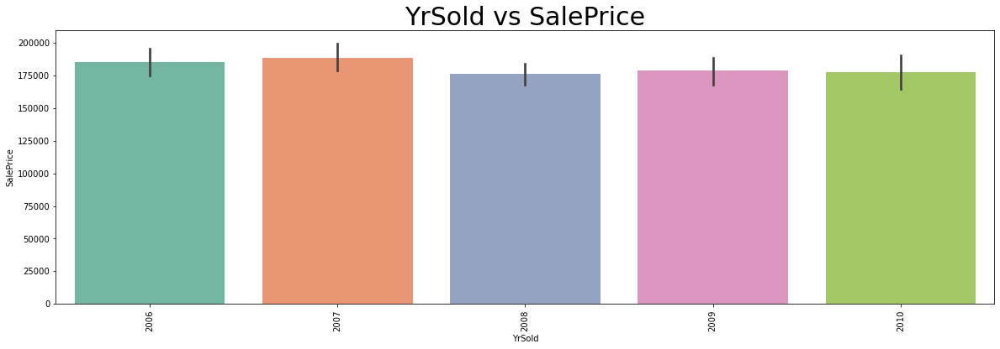

In [86]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['YrSold'], df_train['SalePrice'], palette='Set2')
plt.title('YrSold vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**The SalePrice of the house seems like it actually doesn't depend on the Year Sold**

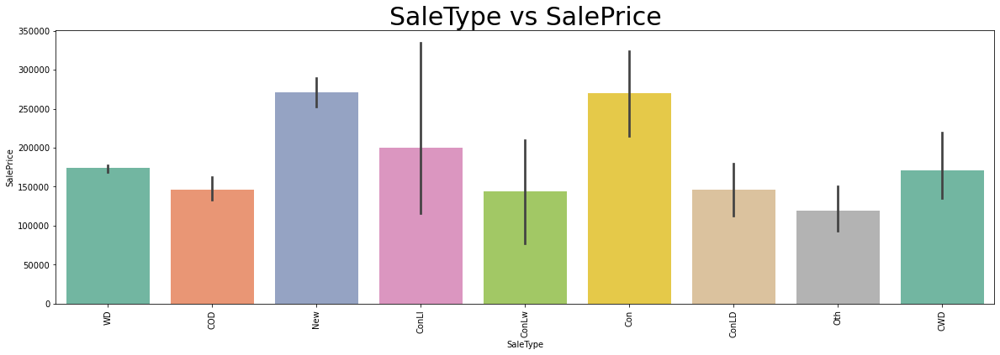

In [87]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['SaleType'], df_train['SalePrice'], palette='Set2')
plt.title('SaleType vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()

**The SalePrice of the house is high for the SaleType New and Con**

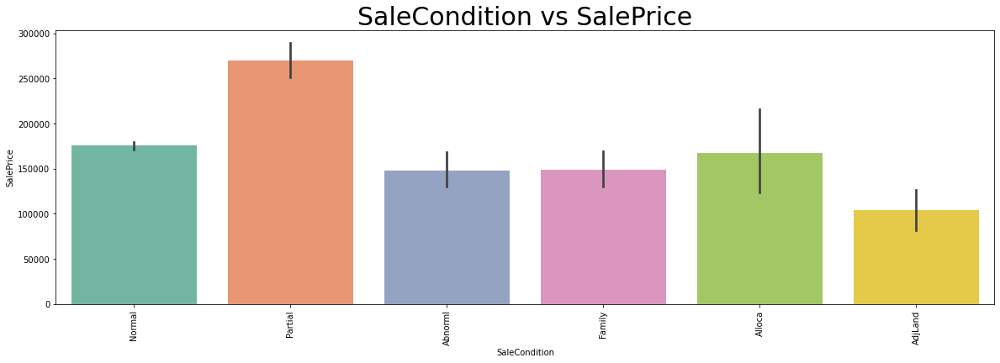

In [88]:
plt.figure(figsize=(20,6))
sns.barplot(df_train['SaleCondition'], df_train['SalePrice'], palette='Set2')
plt.title('SaleCondition vs SalePrice', size=30)
plt.xticks(rotation=90)
plt.show()




**As seen from the above graph, we can infer that the SalePrice of the house is highest for the Sale Condition being Partial** 


**Multi-Variant Analysis**

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5, 32.5,
        33.5, 34.5, 35.5, 36.5, 37.5]),
 [Text(0, 0.5, 'Id'),
  Text(0, 1.5, 'MSSubClass'),
  Text(0, 2.5, 'LotFrontage'),
  Text(0, 3.5, 'LotArea'),
  Text(0, 4.5, 'OverallQual'),
  Text(0, 5.5, 'OverallCond'),
  Text(0, 6.5, 'YearBuilt'),
  Text(0, 7.5, 'YearRemodAdd'),
  Text(0, 8.5, 'MasVnrArea'),
  Text(0, 9.5, 'BsmtFinSF1'),
  Text(0, 10.5, 'BsmtFinSF2'),
  Text(0, 11.5, 'BsmtUnfSF'),
  Text(0, 12.5, 'TotalBsmtSF'),
  Text(0, 13.5, '1stFlrSF'),
  Text(0, 14.5, '2ndFlrSF'),
  Text(0, 15.5, 'LowQualFinSF'),
  Text(0, 16.5, 'GrLivArea'),
  Text(0, 17.5, 'BsmtFullBath'),
  Text(0, 18.5, 'BsmtHalfBath'),
  Text(0, 19.5, 'FullBath'),
  Text(0, 20.5, 'HalfBath'),
  Text(0, 21.5, 'BedroomAbvGr'),
  Text(0, 22.5, 'KitchenAbvGr'),
  Text(0, 23.5, 'TotRmsAbvGrd'),
  Text(0

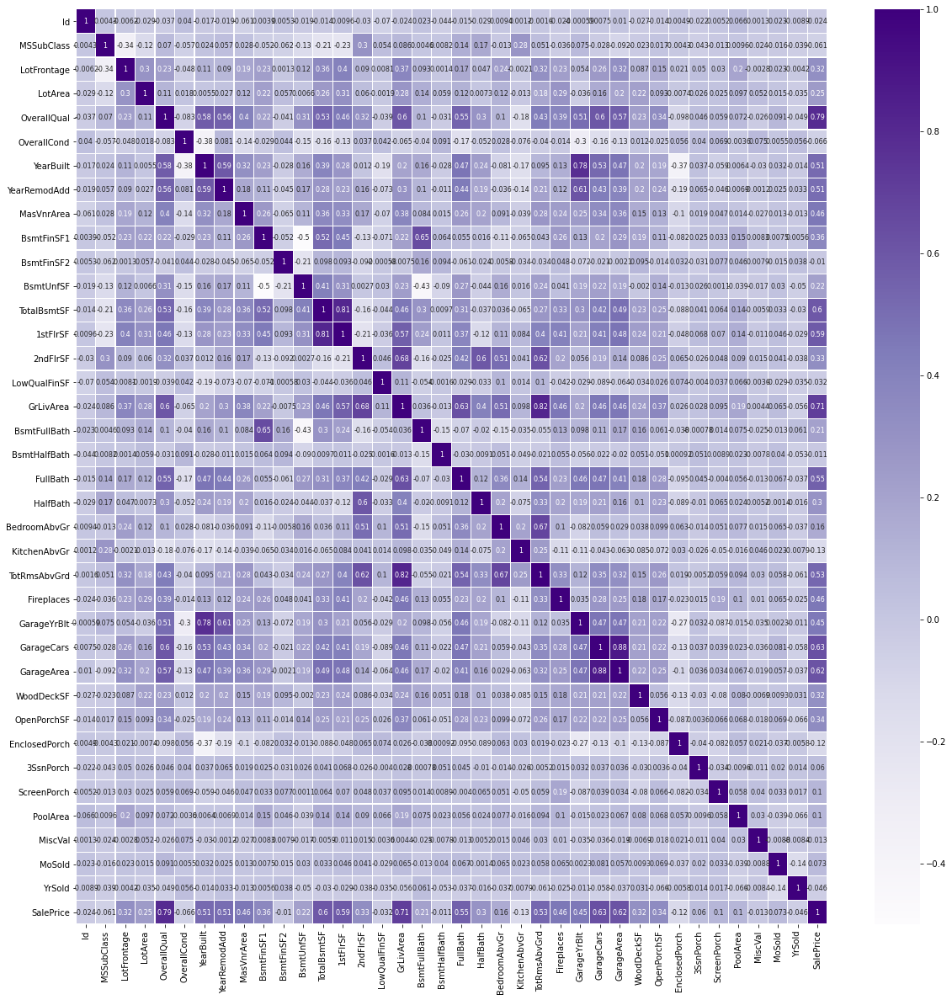

In [89]:
plt.figure(figsize=(20,20))
sns.heatmap(df_train_num.corr(),linewidths=.2,cmap="Purples", annot=True, annot_kws={"size": 8})
plt.yticks(rotation=0)

In [90]:
# From this heatmap we have got the correlation values and we can see that the column "OverallQual" and "GrLivArea"
# has high positive correlation with the target column compared to all other columns
# So as the OverallQual and GrLivArea are higher, the Sale prize of the house is higher
# The column "BsmtFinSF2" and "BsmtHalfBath" have weak correlation value with the target variable(not a very important factor because the 
# correlation value is close to zero)
# The columns with negative correlation with the target variable is "OverallCond", "BsmtFinSF2", "LowQualFinSF2", "EnclosedPorch", "MiscVal"
# and "YrSold"


In [91]:
cor = df_train.corr()
cor

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.004259,-0.006629,-0.029212,-0.036965,0.039761,-0.016942,-0.018590,-0.060652,0.003868,...,-0.027498,-0.013642,0.004885,-0.021773,0.005169,0.065832,0.001304,0.023479,-0.008853,-0.023897
MSSubClass,0.004259,1.000000,-0.365220,-0.124151,0.070462,-0.056978,0.023988,0.056618,0.027868,-0.052236,...,-0.022609,0.017468,-0.004252,-0.043210,-0.013291,0.009583,-0.023503,-0.016015,-0.038595,-0.060775
LotFrontage,-0.006629,-0.365220,1.000000,0.557257,0.247809,-0.053345,0.118554,0.096050,0.202225,0.247780,...,0.101751,0.167092,0.023118,0.059508,0.033111,0.223429,-0.004559,0.025046,-0.004296,0.341294
LotArea,-0.029212,-0.124151,0.557257,1.000000,0.107188,0.017513,0.005506,0.027228,0.121448,0.221851,...,0.216720,0.093080,-0.007446,0.025794,0.025256,0.097107,0.051679,0.015141,-0.035399,0.249499
OverallQual,-0.036965,0.070462,0.247809,0.107188,1.000000,-0.083167,0.575800,0.555945,0.409163,0.219643,...,0.227137,0.341030,-0.098374,0.045919,0.059387,0.072247,-0.025786,0.090638,-0.048759,0.789185
OverallCond,0.039761,-0.056978,-0.053345,0.017513,-0.083167,1.000000,-0.377731,0.080669,-0.137882,-0.028810,...,0.012290,-0.024899,0.056074,0.040476,0.069463,-0.003603,0.075178,0.005519,0.055517,-0.065642
YearBuilt,-0.016942,0.023988,0.118554,0.005506,0.575800,-0.377731,1.000000,0.592829,0.323006,0.227933,...,0.204830,0.191069,-0.373544,0.037079,-0.058760,0.006408,-0.030008,0.031754,-0.013976,0.514408
YearRemodAdd,-0.018590,0.056618,0.096050,0.027228,0.555945,0.080669,0.592829,1.000000,0.181869,0.114430,...,0.197410,0.238755,-0.193574,0.064763,-0.046220,0.006874,-0.001199,0.024663,0.033265,0.507831
MasVnrArea,-0.060652,0.027868,0.202225,0.121448,0.409163,-0.137882,0.323006,0.181869,1.000000,0.267066,...,0.151978,0.131850,-0.102321,0.018721,0.046509,0.013590,-0.027583,0.013432,-0.013493,0.466386
BsmtFinSF1,0.003868,-0.052236,0.247780,0.221851,0.219643,-0.028810,0.227933,0.114430,0.267066,1.000000,...,0.192939,0.108802,-0.082351,0.025485,0.033490,0.154769,0.008314,0.007482,0.005614,0.362874


In [92]:
# This is the correlation values for our dataset which we saw visually using the heatmap
# We can see that the OverallQual and "GrLivArea" have high positive correlation with our target variable i.e., SalePrice

In [93]:
# Representing which columns have positive and negative correlations with the target column

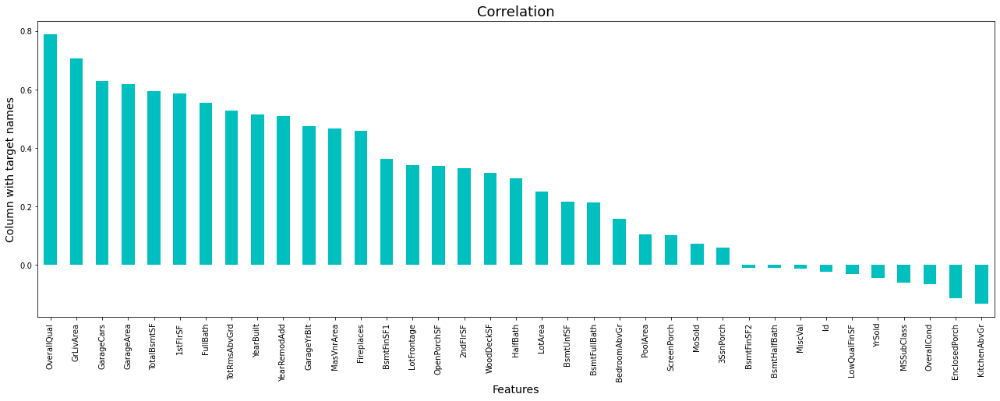

In [94]:
plt.figure(figsize=(22,7))
df_train.corr()['SalePrice'].sort_values(ascending=False).drop(["SalePrice"]).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=14)
plt.ylabel('Column with target names',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

In [95]:
# Here we can infer that the columns many columns are positively correlated with our target column
# And the variables "BsmtFinSF2", "BsmtHalfBath", "MiscVal", "Id", "LowQualFinSF", "YrSold","MSSubClass", "OverallCond", "EnclosedPorch" and 
# "KitchenAbvGr" are negatively correlated
# OverallQual and GrLivArea have high positive correlation i.e., 0.79 and 0.71 and are important features in prediction of 
# SalePrice

**Checking the presence of Outliers**

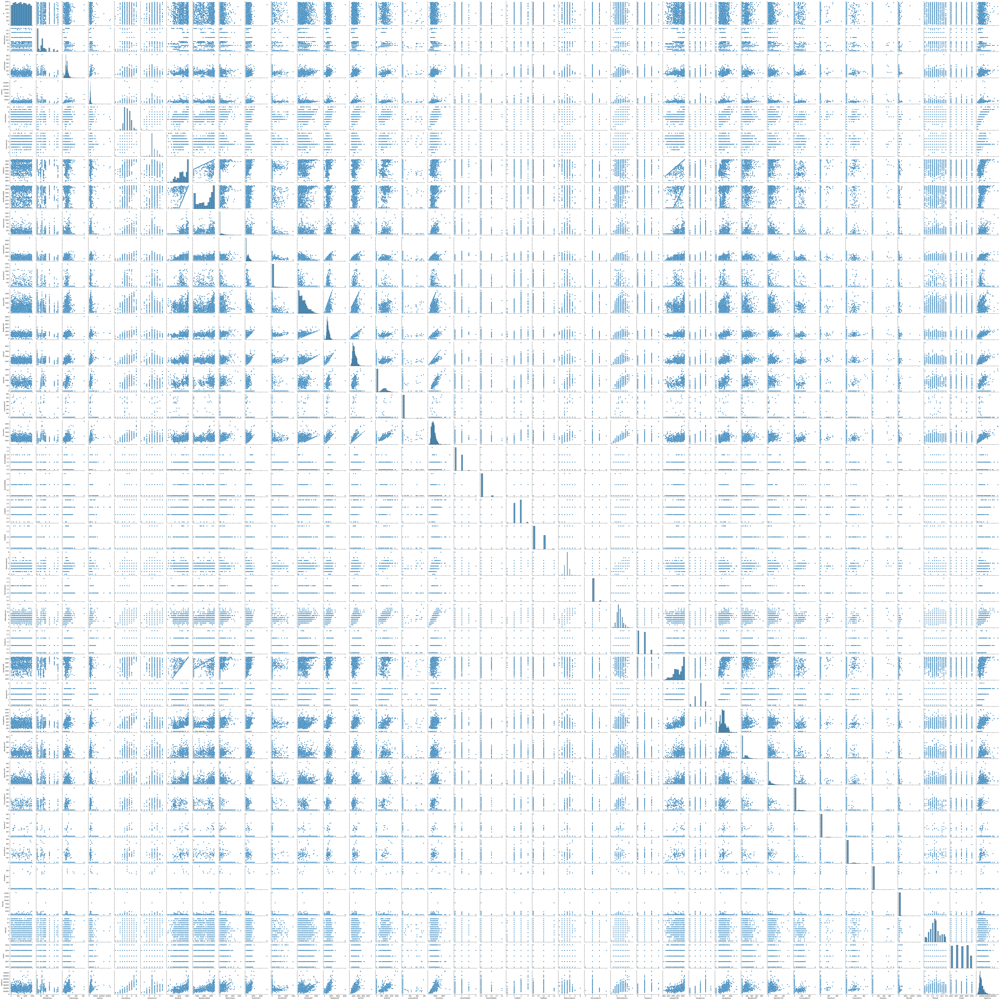

In [96]:
sns.pairplot(df_train)

**We can see the presence of outliers in almost all the columns of our training set.**

In [ ]:
sns.pairplot(df_test)

**We find the presence of outliers in many columns of our testing set**

In [98]:
df_train.skew()

Id                0.026526
MSSubClass        1.422019
LotFrontage       2.450241
LotArea          10.659285
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
MasVnrArea        2.826173
BsmtFinSF1        1.871606
BsmtFinSF2        4.365829
BsmtUnfSF         0.909057
TotalBsmtSF       1.744591
1stFlrSF          1.513707
2ndFlrSF          0.823479
LowQualFinSF      8.666142
GrLivArea         1.449952
BsmtFullBath      0.627106
BsmtHalfBath      4.264403
FullBath          0.057809
HalfBath          0.656492
BedroomAbvGr      0.243855
KitchenAbvGr      4.365259
TotRmsAbvGrd      0.644657
Fireplaces        0.671966
GarageYrBlt      -0.644564
GarageCars       -0.358556
GarageArea        0.189665
WoodDeckSF        1.504929
OpenPorchSF       2.410840
EnclosedPorch     3.043610
3SsnPorch         9.770611
ScreenPorch       4.105741
PoolArea         13.243711
MiscVal          23.065943
MoSold            0.220979
YrSold            0.115765
S


**We can see the presence of skewness in our data**

**As we saw the presence of outliers and hence the skewness is present**

**-(0.5) to +(0.5), the skewness within this range is acceptable**

**We have skewness of many columns way outside the above mentioned range and they need to be treated.**

**Skewness is present highly.**

In [99]:
df_test.skew()

Id               -0.108806
MSSubClass        1.358597
LotFrontage       0.429744
LotArea          12.781805
OverallQual       0.397312
OverallCond       1.209714
YearBuilt        -0.755233
YearRemodAdd     -0.535600
MasVnrArea        1.973451
BsmtFinSF1        0.739790
BsmtFinSF2        3.698543
BsmtUnfSF         0.960708
TotalBsmtSF       0.519257
1stFlrSF          0.692047
2ndFlrSF          0.765511
LowQualFinSF     10.929928
GrLivArea         1.010586
BsmtFullBath      0.463685
BsmtHalfBath      3.544994
FullBath         -0.049800
HalfBath          0.758892
BedroomAbvGr      0.075315
KitchenAbvGr      4.849432
TotRmsAbvGrd      0.805535
Fireplaces        0.540164
GarageYrBlt      -0.663073
GarageCars       -0.280324
GarageArea        0.133547
WoodDeckSF        1.708221
OpenPorchSF       2.185030
EnclosedPorch     3.177046
3SsnPorch        12.277476
ScreenPorch       4.182351
PoolArea          0.000000
MiscVal          13.264758
MoSold            0.186504
YrSold            0.018412
d


**We can see the presence of skewness in our data**

**As we saw the presence of outliers and hence the skewness is present**

**-(0.5) to +(0.5), the skewness within this range is acceptable**

**We have skewness of many columns way outside the above mentioned range and they need to be treated.**

**Skewness is present highly**

**Considering to remove the outliers**

In [100]:
# Outlier treatment using IQR

import numpy as np
from numpy import percentile

columns = df_train.columns
for j in columns:
    if isinstance(df_train[j][0], str) :
        continue
    else:
        for i in range(len(df_train)):
            #defining quartiles
            quartiles = percentile(df_train[j], [25,75])
            # calculate min/max
            lower_fence = quartiles[0] - (1.5*(quartiles[1]-quartiles[0]))
            upper_fence = quartiles[1] + (1.5*(quartiles[1]-quartiles[0]))
            if df_train[j][i] > upper_fence:
                df_train[j][i] = upper_fence
            elif df_train[j][i] < lower_fence:
                df_train[j][i] = lower_fence

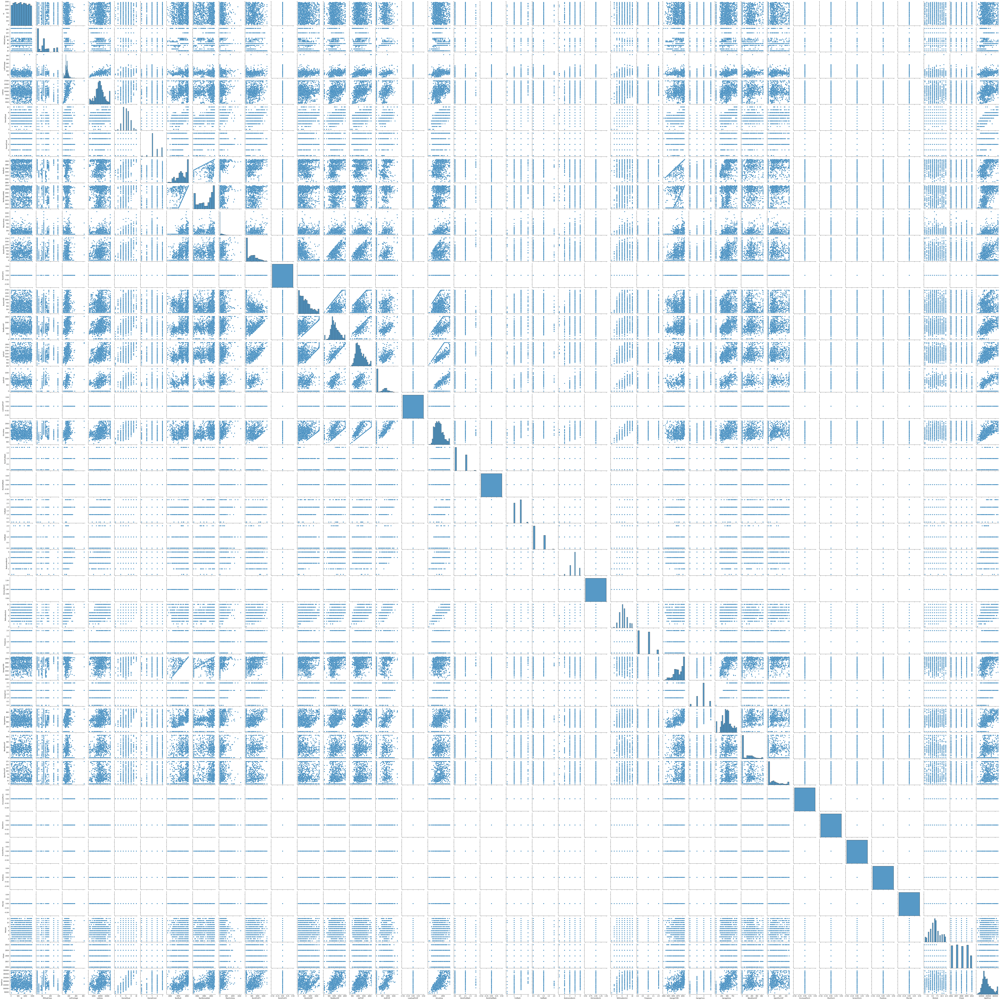

In [101]:
sns.pairplot(df_train)

Outliers are reduced in a greater amount

In [ ]:
sns.pairplot(df_test)

**Here also we can see that in our testing set many outliers are reduced**

**Now since the outliers are removed, the skewness also would be reduced. Let's try to verify**

In [103]:
df_train.skew()


Id               0.026526
MSSubClass       1.016094
LotFrontage      2.450241
LotArea          0.184102
OverallQual      0.214841
OverallCond      0.153829
YearBuilt       -0.562031
YearRemodAdd    -0.495864
MasVnrArea       2.826173
BsmtFinSF1       0.742161
BsmtFinSF2       0.000000
BsmtUnfSF        0.789228
TotalBsmtSF      0.243198
1stFlrSF         0.663710
2ndFlrSF         0.807994
LowQualFinSF     0.000000
GrLivArea        0.587319
BsmtFullBath     0.563386
BsmtHalfBath     0.000000
FullBath         0.057809
HalfBath         0.656492
BedroomAbvGr    -0.437580
KitchenAbvGr     0.000000
TotRmsAbvGrd     0.373806
Fireplaces       0.552677
GarageYrBlt     -0.644564
GarageCars      -0.434745
GarageArea      -0.107166
WoodDeckSF       1.059142
OpenPorchSF      1.154030
EnclosedPorch    0.000000
3SsnPorch        0.000000
ScreenPorch      0.000000
PoolArea         0.000000
MiscVal          0.000000
MoSold           0.220979
YrSold           0.115765
SalePrice        0.786599
dtype: float

**We can compare the results skewness with the skewness before removing the outliers. We see that the amount of skewness is drastically reduced in our training set.**

**Splitting dataset to perform predictions on SalePrice**

In [104]:
# Splitting the training dataset into X features and y label

X = df_final_train.drop(["SalePrice"],axis=1)
y = df_final_train["SalePrice"]

In [105]:
X

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,127,120,70.0,4928,6,5,1976,1976,0.0,120,...,0,0,0,0,1,0,0,0,1,0
1,889,20,95.0,15865,8,6,1970,1970,0.0,351,...,0,0,0,0,1,0,0,0,1,0
2,793,60,92.0,9920,7,5,1996,1997,0.0,862,...,0,0,0,0,1,0,0,0,1,0
3,110,20,105.0,11751,6,6,1977,1977,480.0,705,...,0,0,0,0,0,0,0,0,1,0
4,422,20,70.0,16635,6,7,1977,2000,126.0,1246,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,70.0,9819,5,5,1967,1967,31.0,450,...,0,0,0,0,1,0,0,0,1,0
1164,554,20,67.0,8777,4,5,1949,2003,0.0,0,...,0,0,0,0,1,0,0,0,1,0
1165,196,160,24.0,2280,6,6,1976,1976,0.0,566,...,0,0,0,0,1,0,0,0,1,0
1166,31,70,50.0,8500,4,4,1920,1950,0.0,0,...,0,0,0,0,1,0,0,0,1,0


In [106]:
y

0       128000
1       268000
2       269790
3       190000
4       215000
         ...  
1163    122000
1164    108000
1165    148500
1166     40000
1167    183200
Name: SalePrice, Length: 1168, dtype: int64

# Machine Learning Models

**Hyper-parameter Tuning**

In [107]:
# Train test split on the dataset

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [109]:
# Checking how 10260 rows is split into train and test after performing train-test split

print("The size of training input is", X_train.shape)
print("The size of training output is", y_train.shape)
print(50 *'*')
print("The size of testing input is", X_test.shape)
print("The size of testing output is", y_test.shape)

The size of training input is (817, 244)
The size of training output is (817,)
**************************************************
The size of testing input is (351, 244)
The size of testing output is (351,)


In [110]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.model_selection import GridSearchCV

In [111]:
def model(mod):
    md=mod()
    md.fit(X_train,y_train)
    predict=md.predict(X_test)
    r2score=r2_score(y_test,predict)
    print("model: {}".format(mod))
    print("r2score is {}".format(r2score))
    print("MAE score is {}".format(mean_absolute_error(y_test,predict)))
    print("RMSE score is {}".format(np.sqrt(mean_squared_error(y_test,predict))))

In [112]:
model(LinearRegression)

model: <class 'sklearn.linear_model._base.LinearRegression'>
r2score is 0.2090495669037854
MAE score is 27430.051154293767
RMSE score is 72658.13215811663


In [113]:
model(KNeighborsRegressor)

model: <class 'sklearn.neighbors._regression.KNeighborsRegressor'>
r2score is 0.6109421794066389
MAE score is 32743.70427350427
RMSE score is 50958.50400477279


In [114]:
model(RandomForestRegressor)

model: <class 'sklearn.ensemble._forest.RandomForestRegressor'>
r2score is 0.8222594256475106
MAE score is 19664.45193732194
RMSE score is 34443.15171610388


In [115]:
model(DecisionTreeRegressor)

model: <class 'sklearn.tree._classes.DecisionTreeRegressor'>
r2score is 0.6117899880048494
MAE score is 28467.139601139603
RMSE score is 50902.95105410976


**Our best model is RandomForest Regressor because of its high performance of 82.22% with minimal MAE and RMSE**

**Hyper parameter tuning on our best model**

In [116]:
paramgrid = {'max_depth': list(range(1,20,2)), 'n_estimators': list(range(1,200,20))}
grid=GridSearchCV(RandomForestRegressor(),paramgrid)

In [117]:
grid.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestRegressor(),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19],
                         'n_estimators': [1, 21, 41, 61, 81, 101, 121, 141, 161,
                                          181]})

In [118]:
grid.best_params_

{'max_depth': 9, 'n_estimators': 41}

In [119]:
predict=grid.predict(X_test)
r2score=r2_score(y_test,predict)
print("r2score is {}".format(r2score))
print("MAE score is {}".format(mean_absolute_error(y_test,predict)))
print("RMSE score is {}".format(np.sqrt(mean_squared_error(y_test,predict))))

r2score is 0.8124833256294286
MAE score is 20110.576257018725
RMSE score is 35377.695624871594


With hyper paramter tuning we have increases the performance in some amount

# Saving the model

In [120]:
# Serializing or saving the model
# Importing the necessary library for saving the model

import joblib
joblib.dump(model(RandomForestRegressor),"FinalModel.pkl")

model: <class 'sklearn.ensemble._forest.RandomForestRegressor'>
r2score is 0.8154062060859342
MAE score is 19751.716068376067
RMSE score is 35100.89118218068


['FinalModel.pkl']

**Final Model is saved**